# Comparison of neighbourhoods in Toronto and New York

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

**New Yorke** and **Toronto** are both financial capitals of USA and Canada respectively. Both cities are located on the east coast of North America. **Toronto** has population of 2.7 million people while **New York** 8.2 million. Both cities are most populous in their respective countries and they are 8 hours drive apart. 

In this project we aim to investigate the similarities and differences between the neighbourhoods of both cities based on the venues that are present in them. 

## Data <a name="data"></a>

Toronto data for postal codes for neighbourhoods was obtained from wikipedia pages of postal codes of Canada at: https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'. 

New York has a total of 5 boroughs and 306 neighborhoods. Data was available at https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json as part of the coursera course.

The data on the venues for both cities was obtained using Foursquare API.

## Methodoogy <a name="Methodology"></a>

Data was preprocessed to produce dataframes of each neighbourhoods with corresponding top 10 venues in that neighbourhood. K means cluster analysis was then done for individual cities and on the combined dataset with neighbourhoods of both cities. 

## Analysis <a name="analysis"></a>

Installing necessary packages

In [84]:
#!pip install pandas
#!pip install requests
# !pip install bs4
# !pip install geopy
# !pip install folium
# !pip install geocoder
#!pip install plotly
!pip install wget

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9680 sha256=01b42801caed09660e76e5cdeea299a2f89bdfec780c2184e15b55ad2fcb8508
  Stored in directory: c:\users\diyar\appdata\local\pip\cache\wheels\bd\a8\c3\3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget


Importing necessary packages

In [85]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

# !conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

# Install website scraping libraries and packages in Python from BeautifulSoup 
#!conda install -c conda-forge beautifulsoup4 --yes  # uncomment this line if you haven't completed 
from bs4 import BeautifulSoup

import wget

import matplotlib.pyplot as plt
print('Libraries imported.')

Libraries imported.


### Toronto analysis

In order to donwload Toronto neighbourhood data, we need to scrap Toronto neighbourhoods using postal codes of Canada wikipedia page: "'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'"

In [2]:
#getting the URL for postal codes for each neighbourhour in toronto
source = requests.get('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M').text
#print(source)
soup  = BeautifulSoup(source,'lxml')
soup

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
<head>
<meta charset="utf-8"/>
<title>List of postal codes of Canada: M - Wikipedia</title>
<script>document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"1993c916-9af4-430a-baf1-ba83d87c1d21","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_postal_codes_of_Canada:_M","wgTitle":"List of postal codes of Canada: M","wgCurRevisionId":1032600019,"wgRevisionId":1032600019,"wgArticleId":539066,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Articles with short description","Short description is different from Wikidata","Communications in Ontario",

In [3]:
table_contents=[]
table=soup.find('table')
table

<table cellpadding="2" cellspacing="0" rules="all" style="width:100%;">
<tbody><tr>
<td style="width:11%;">
<p>M1A<br/><span style="font-size:85%;">Not assigned</span>
</p>
</td>
<td style="width:11%;">
<p>M2A<br/><span style="font-size:85%;">Not assigned</span>
</p>
</td>
<td style="width:11%;">
<p>M3A<br/><span style="font-size:85%;"><a href="/wiki/North_York" title="North York">North York</a><br/>(<a href="/wiki/Parkwoods" title="Parkwoods">Parkwoods</a>)</span>
</p>
</td>
<td style="width:11%;">
<p>M4A<br/><span style="font-size:85%;"><a href="/wiki/North_York" title="North York">North York</a><br/>(<a href="/wiki/Victoria_Village" title="Victoria Village">Victoria Village</a>)</span>
</p>
</td>
<td style="width:11%;">
<p>M5A<br/><span style="font-size:85%;"><a href="/wiki/Downtown_Toronto" title="Downtown Toronto">Downtown Toronto</a><br/>(<a href="/wiki/Regent_Park" title="Regent Park">Regent Park</a> / <a href="/wiki/Harbourfront,_Toronto" title="Harbourfront, Toronto">Harbourfr

In [4]:
# following course instruction on creating the datafram with Postal codes, Boroughs and Neighbourhoods 
# by extracting from soup object

table_contents=[]
table=soup.find('table')
for row in table.findAll('td'):
    cell = {}
    if row.span.text=='Not assigned':
        pass
    else:
        cell['PostalCode'] = row.p.text[:3]
        cell['Borough'] = (row.span.text).split('(')[0]
        cell['Neighborhood'] = (((((row.span.text).split('(')[1]).strip(')')).replace(' /',',')).replace(')',' ')).strip(' ')
        table_contents.append(cell)

# print(table_contents)
df=pd.DataFrame(table_contents)
df['Borough']=df['Borough'].replace({'Downtown TorontoStn A PO Boxes25 The Esplanade':'Downtown Toronto Stn A',
                                             'East TorontoBusiness reply mail Processing Centre969 Eastern':'East Toronto Business',
                                             'EtobicokeNorthwest':'Etobicoke Northwest','East YorkEast Toronto':'East York/East Toronto',
                                             'MississaugaCanada Post Gateway Processing Centre':'Mississauga'})

In [5]:
df.shape

(103, 3)

In [6]:
df.head()

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Queen's Park,Ontario Provincial Government


Section 2: getting the long and lat for each postal code using Geocoder (didnt work - so loading the lat and long using CSV file)

In [7]:
lat_long = pd.read_csv('Geospatial_Coordinates.csv')
lat_long.head()

,PostalCode,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [8]:
df = pd.merge(df, lat_long, on='PostalCode')
df.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Queen's Park,Ontario Provincial Government,43.662301,-79.389494


## Creat a map of Toronto neighbourhoods on the map

#### First get the lat and long of Toronto

In [9]:
address = 'Toronto, TOR'

geolocator = Nominatim(user_agent="tor_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto are 43.7370584, -79.2442535.


In [10]:
# create map of Toronto using latitude and longitude values
map_toronto = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(df['Latitude'], df['Longitude'], df['Borough'], df['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

#### Define Foursquare Credentials and Version

In [11]:
CLIENT_ID = 'S5FUPCPQHBF3YXMIHLZOULCGUEXEH4XVQHDXSWXY5MNYYIYQ' # your Foursquare ID
CLIENT_SECRET = 'IJLV0TK2X2S1VYZGJKI0XP4E3JOZG1SA1JJKYSZWOKDBSIWV' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: S5FUPCPQHBF3YXMIHLZOULCGUEXEH4XVQHDXSWXY5MNYYIYQ
CLIENT_SECRET:IJLV0TK2X2S1VYZGJKI0XP4E3JOZG1SA1JJKYSZWOKDBSIWV


Get_the_category function that we will use to extract the venues later

In [12]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Creat a function to get all the venues in the neighbourhoods we selected

In [13]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [14]:
toronto_venues = getNearbyVenues(names=df['Neighborhood'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )

Parkwoods
Victoria Village
Regent Park, Harbourfront
Lawrence Manor, Lawrence Heights
Ontario Provincial Government
Islington Avenue
Malvern, Rouge
Don Mills North
Parkview Hill, Woodbine Gardens
Garden District, Ryerson
Glencairn
West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
Rouge Hill, Port Union, Highland Creek
Don Mills South
Woodbine Heights
St. James Town
Humewood-Cedarvale
Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Wilson Heights, Downsview North
Thorncliffe Park
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
The Danforth  East
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
Kennedy Park, Ionview, East Birchmount Park
Bayview Village
Downsview East
The Danforth

In [15]:
print(print(toronto_venues.shape))
toronto_venues.head()

(2149, 7)
None


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.753259,-79.329656,Brookbanks Park,43.751976,-79.332140,Park
1,Parkwoods,43.753259,-79.329656,KFC,43.754387,-79.333021,Fast Food Restaurant
2,Parkwoods,43.753259,-79.329656,Variety Store,43.751974,-79.333114,Food & Drink Shop
3,Victoria Village,43.725882,-79.315572,Victoria Village Arena,43.723481,-79.315635,Hockey Arena
4,Victoria Village,43.725882,-79.315572,Tim Hortons,43.725517,-79.313103,Coffee Shop


Checking how many for each neighbourhood

In [26]:
d=toronto_venues.groupby('Neighborhood').count()
d

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Agincourt,4,4,4,4,4,4
"Alderwood, Long Branch",9,9,9,9,9,9
"Bathurst Manor, Wilson Heights, Downsview North",22,22,22,22,22,22
Bayview Village,4,4,4,4,4,4
"Bedford Park, Lawrence Manor East",25,25,25,25,25,25
Berczy Park,58,58,58,58,58,58
"Birch Cliff, Cliffside West",4,4,4,4,4,4
"Brockton, Parkdale Village, Exhibition Place",25,25,25,25,25,25
"CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport",16,16,16,16,16,16


In [18]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 270 uniques categories.


(array([330.,  90.,  42.,  42.,  24.,   6.,  18.,   6.,   6.,  42.]),
 array([  1. ,  10.9,  20.8,  30.7,  40.6,  50.5,  60.4,  70.3,  80.2,
         90.1, 100. ]),
 <a list of 10 Patch objects>)

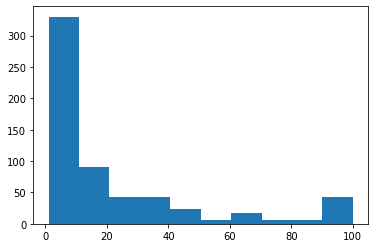

In [29]:
counts, bins = np.histogram(d)
plt.hist(bins[:-1], bins, weights=counts)

Also majority of neighbourhoods have less than 20 venues

### Analyze each neighbourhood

In [30]:
# one hot encoding 
tor_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")
tor_onehot.head()

# add neighborhood column back to dataframe
tor_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 
tor_onehot.head()

#as it didnt go to the last spot i remove it and add it back at first location
col_name='Neighborhood'
first_col = tor_onehot.pop(col_name)
tor_onehot.insert(0, col_name, first_col)
tor_onehot.head()

,Neighborhood,Accessories Store,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean BBQ Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Luggage Store,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Restaurant,Tibetan Restaurant,Toy / Game Store,Trail,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Parkwoods,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [31]:
tor_onehot.shape

(2149, 270)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [32]:
tor_grouped = tor_onehot.groupby('Neighborhood').mean().reset_index()
tor_grouped

,Neighborhood,Accessories Store,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean BBQ Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Luggage Store,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Restaurant,Tibetan Restaurant,Toy / Game Store,Trail,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Agincourt,0.000000,0.000000,0.0000,0.000,0.0000,0.000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0000,0.000000,0

### Print top 5 venues in each neighbourhood


In [33]:
num_top_venues = 5

for hood in tor_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = tor_grouped[tor_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Agincourt----
                       venue  freq
0  Latin American Restaurant  0.25
1             Clothing Store  0.25
2             Breakfast Spot  0.25
3                     Lounge  0.25
4                      Motel  0.00


----Alderwood, Long Branch----
            venue  freq
0     Pizza Place  0.22
1        Pharmacy  0.11
2             Pub  0.11
3     Coffee Shop  0.11
4  Sandwich Place  0.11


----Bathurst Manor, Wilson Heights, Downsview North----
                       venue  freq
0                       Bank  0.09
1                Coffee Shop  0.09
2               Intersection  0.05
3  Middle Eastern Restaurant  0.05
4          Mobile Phone Shop  0.05


----Bayview Village----
                 venue  freq
0  Japanese Restaurant  0.25
1                 Bank  0.25
2   Chinese Restaurant  0.25
3                 Café  0.25
4               Museum  0.00


----Bedford Park, Lawrence Manor East----
                venue  freq
0         Pizza Place  0.08
1      Sandwich Place  0.08

                 venue  freq
0       Baseball Field   1.0
1    Accessories Store   0.0
2    Mobile Phone Shop   0.0
3                Motel   0.0
4  Moroccan Restaurant   0.0


----Humewood-Cedarvale----
                venue  freq
0               Field  0.25
1        Hockey Arena  0.25
2               Trail  0.25
3        Tennis Court  0.25
4  Miscellaneous Shop  0.00


----India Bazaar, The Beaches West----
                venue  freq
0      Sandwich Place  0.10
1          Steakhouse  0.05
2          Restaurant  0.05
3  Italian Restaurant  0.05
4       Movie Theater  0.05


----Kennedy Park, Ionview, East Birchmount Park----
              venue  freq
0       Coffee Shop  0.25
1        Hobby Shop  0.25
2  Department Store  0.25
3    Discount Store  0.25
4     Metro Station  0.00


----Kensington Market, Chinatown, Grange Park----
                   venue  freq
0                   Café  0.07
1                    Bar  0.07
2  Vietnamese Restaurant  0.04
3            Coffee Shop  0.04
4  

                venue  freq
0                Park  0.50
1        Intersection  0.25
2   Convenience Store  0.25
3  Miscellaneous Shop  0.00
4               Motel  0.00


----The Danforth West, Riverdale----
                    venue  freq
0        Greek Restaurant  0.17
1             Coffee Shop  0.10
2      Italian Restaurant  0.07
3  Furniture / Home Store  0.05
4          Ice Cream Shop  0.05


----The Kingsway, Montgomery Road, Old Mill North----
                venue  freq
0                Pool  0.33
1               River  0.33
2          Smoke Shop  0.33
3   Accessories Store  0.00
4  Miscellaneous Shop  0.00


----Thorncliffe Park----
               venue  freq
0  Indian Restaurant  0.10
1        Yoga Studio  0.05
2       Intersection  0.05
3        Pizza Place  0.05
4               Park  0.05


----Toronto Dominion Centre, Design Exchange----
         venue  freq
0  Coffee Shop  0.12
1        Hotel  0.06
2         Café  0.06
3   Restaurant  0.04
4  Salad Place  0.03


----Unive

#### Let's put that into a _pandas_ dataframe

First, let's write a function to sort the venues in descending order.


In [34]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [35]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = tor_grouped['Neighborhood']

for ind in np.arange(tor_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(tor_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Clothing Store,Lounge,Breakfast Spot,Latin American Restaurant,Eastern European Restaurant,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant
1,"Alderwood, Long Branch",Pizza Place,Pharmacy,Pub,Sandwich Place,Gym,Playground,Coffee Shop,Skating Rink,Dim Sum Restaurant,Diner
2,"Bathurst Manor, Wilson Heights, Downsview North",Coffee Shop,Bank,Deli / Bodega,Fried Chicken Joint,Shopping Mall,Sandwich Place,Diner,Middle Eastern Restaurant,Restaurant,Supermarket
3,Bayview Village,Café,Bank,Chinese Restaurant,Japanese Restaurant,Yoga Studio,Discount Store,Dog Run,Doner Restaurant,Donut Shop,Drugstore
4,"Bedford Park, Lawrence Manor East",Sandwich Place,Italian Restaurant,Coffee Shop,Pizza Place,Greek Restaurant,Thai Restaurant,Boutique,Comfort Food Restaurant,Fast Food Restaurant,Juice Bar


## Cluster Neighborhoods

Run k-means clustering with 10 clusters

In [46]:
# set number of clusters
kclusters = 10

tor_grouped_clustering = tor_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(tor_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([3, 3, 3, 1, 3, 3, 1, 3, 3, 2])

In [ ]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [52]:
df.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Queen's Park,Ontario Provincial Government,43.662301,-79.389494


Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [50]:
tor_merged = toronto_venues

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
tor_merged = tor_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

tor_merged.head() # check the last columns! - its adding in alphabetic order column number 5

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Parkwoods,43.753259,-79.329656,Brookbanks Park,43.751976,-79.332140,Park,1,Fast Food Restaurant,Park,Food & Drink Shop,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore
1,Parkwoods,43.753259,-79.329656,KFC,43.754387,-79.333021,Fast Food Restaurant,1,Fast Food Restaurant,Park,Food & Drink Shop,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore
2,Parkwoods,43.753259,-79.329656,Variety Store,43.751974,-79.333114,Food & Drink Shop,1,Fast Food Restaurant,Park,Food & Drink Shop,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore
3,Victoria Village,43.725882,-79.315572,Victoria Village Arena,43.723481,-79.315635,Hockey Arena,3,Portuguese Restaurant,Pizza Place,Coffee Shop,Hockey Arena,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop
4,Victoria Village,43.725882,-79.315572,Tim Hortons,43.725517,-79.313103,Coffee Shop,3,Portuguese Restaurant,Pizza Place,Coffee Shop,Hockey Arena,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop


In [55]:
#rename column names
tor_merged.rename(columns={'Neighborhood Latitude': 'Latitude', 'Neighborhood Longitude': 'Longitude'}, inplace = True)

### Create a map

Majority are cluster 3 so we examine it and qualitatively compare to cluster 5 one of the rarest

In [ ]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(tor_merged['Latitude'], tor_merged['Longitude'], tor_merged['Neighborhood'], tor_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [80]:
tor_merged['Cluster Labels'].value_counts()

3    2058
1      53
2      21
7       4
0       4
8       3
5       2
4       2
9       1
6       1
Name: Cluster Labels, dtype: int64

In [79]:
tor_merged.loc[tor_merged['Cluster Labels'] == 3, tor_merged.columns[[0]+ list(range(8, tor_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,Victoria Village,Portuguese Restaurant,Pizza Place,Coffee Shop,Hockey Arena,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop
4,Victoria Village,Portuguese Restaurant,Pizza Place,Coffee Shop,Hockey Arena,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop
5,Victoria Village,Portuguese Restaurant,Pizza Place,Coffee Shop,Hockey Arena,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop
6,Victoria Village,Portuguese Restaurant,Pizza Place,Coffee Shop,Hockey Arena,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop
7,"Regent Park, Harbourfront",Coffee Shop,Bakery,Pub,Park,Breakfast Spot,Café,Theater,Yoga Studio,Beer Store,Shoe Store
8,"Regent Park, Harbourfront",Coffee Shop,Bakery,Pub,Park,Breakfast Spot,Café,Theater,Yoga Studio,Beer Store,Shoe Store
9,"Regent Park, Harbourfront",Coffee Shop,Bakery,Pub,Park,Breakfast Spot,Café,Theater,Yoga Studio,Beer Store,Shoe Store
10,"Regent Park, Harbourfront",Coffee Shop,Bakery,Pub,Park,Breakfast Spot,Café,Theater,Yoga Studio,Beer Store,Shoe Store
11,"Regent Park, Harbourfront",Coffee Shop,Bakery,Pub,Park,Breakfast Spot,Café,Theater,Yoga Studio,Beer Store,Shoe Store
12,"Regent Park, Harbourfront",Coffee Shop,Bakery,Pub,Park,Breakfast Spot,Café,Theater,Yoga Studio,Beer Store,Shoe Store


In [78]:
tor_merged.loc[tor_merged['Cluster Labels'] == 5, tor_merged.columns[[0]+ list(range(8, tor_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
705,Scarborough Village,Playground,Yoga Studio,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant
1637,"Moore Park, Summerhill East",Playground,Yoga Studio,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant


Cluster 3 are parks while 1 is busy town districts area, cluster 5 are more laid back areas

## New York Analysis

In [88]:
# loading the data
!wget -q -O 'newyork_data.json' https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json
print('Data downloaded!')

Data downloaded!


'wget' is not recognized as an internal or external command,
operable program or batch file.


In [90]:
import wget
url = 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json'
myfile = wget.download(url)

In [91]:
myfile

'newyork_data.json'

Exploring the data

In [92]:
with open(myfile) as json_data:
    newyork_data = json.load(json_data)

In [93]:
newyork_data

{'type': 'FeatureCollection',
 'totalFeatures': 306,
 'features': [{'type': 'Feature',
   'id': 'nyu_2451_34572.1',
   'geometry': {'type': 'Point',
    'coordinates': [-73.84720052054902, 40.89470517661]},
   'geometry_name': 'geom',
   'properties': {'name': 'Wakefield',
    'stacked': 1,
    'annoline1': 'Wakefield',
    'annoline2': None,
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.84720052054902,
     40.89470517661,
     -73.84720052054902,
     40.89470517661]}},
  {'type': 'Feature',
   'id': 'nyu_2451_34572.2',
   'geometry': {'type': 'Point',
    'coordinates': [-73.82993910812398, 40.87429419303012]},
   'geometry_name': 'geom',
   'properties': {'name': 'Co-op City',
    'stacked': 2,
    'annoline1': 'Co-op',
    'annoline2': 'City',
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.82993910812398,
     40.87429419303012,
     -73.82993910812398,
     40.87429419303012]}},
  {'type': 'Feature',
 

In [94]:
neighborhoods_data = newyork_data['features']

In [95]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

#### Tranform the data into a _pandas_ dataframe


In [96]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

Then let's loop through the data and fill the dataframe one row at a time.


In [97]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

Quickly examine the resulting dataframe.

In [98]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [99]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


#### Use geopy library to get the latitude and longitude values of New York City.


In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent <em>ny_explorer</em>, as shown below.

In [100]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


#### Create a map of New York with neighborhoods superimposed on top.


Next, we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.

In [ ]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

#### Define Foursquare Credentials and Version

In [102]:
CLIENT_ID = 'S5FUPCPQHBF3YXMIHLZOULCGUEXEH4XVQHDXSWXY5MNYYIYQ' # your Foursquare ID
CLIENT_SECRET = 'IJLV0TK2X2S1VYZGJKI0XP4E3JOZG1SA1JJKYSZWOKDBSIWV' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: S5FUPCPQHBF3YXMIHLZOULCGUEXEH4XVQHDXSWXY5MNYYIYQ
CLIENT_SECRET:IJLV0TK2X2S1VYZGJKI0XP4E3JOZG1SA1JJKYSZWOKDBSIWV


#### Let's explore the first neighborhood in our dataframe.


Get the neighborhood's name.

In [104]:
neighborhoods.loc[0, 'Neighborhood']

'Wakefield'

Get the neighborhood's latitude and longitude values.


In [105]:
neighborhood_latitude = neighborhoods.loc[0, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = neighborhoods.loc[0, 'Longitude'] # neighborhood longitude value

neighborhood_name = neighborhoods.loc[0, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Wakefield are 40.89470517661, -73.84720052054902.


In [106]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Now we are ready to clean the json and structure it into a pandas dataframe.

In [ ]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

## 2. Explore Neighborhoods in New York

#### Function to get all the venues in neighborhoods of NY

In [107]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Now write the code to run the above function on each neighborhood and create a new dataframe called _manhattan_venues_.

In [111]:
# type your answer here
ny_venues = getNearbyVenues(names=neighborhoods['Neighborhood'],
                                   latitudes=neighborhoods['Latitude'],
                                   longitudes=neighborhoods['Longitude']
                                  )

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

#### Let's check the size of the resulting dataframe

In [112]:
print(ny_venues.shape)
ny_venues.head()

(10158, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
4,Wakefield,40.894705,-73.847201,Cooler Runnings Jamaican Restaurant,40.898083,-73.850259,Caribbean Restaurant


Let's check how many venues were returned for each neighborhood

In [115]:
c = ny_venues.groupby('Neighborhood').count()
c

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Allerton,29,29,29,29,29,29
Annadale,9,9,9,9,9,9
Arden Heights,5,5,5,5,5,5
Arlington,5,5,5,5,5,5
Arrochar,23,23,23,23,23,23
Arverne,21,21,21,21,21,21
Astoria,100,100,100,100,100,100
Astoria Heights,13,13,13,13,13,13
Auburndale,19,19,19,19,19,19


#### Let's find out how many unique categories can be curated from all the returned venues

In [ ]:
print('There are {} uniques categories.'.format(len(ny_venues['Venue Category'].unique())))

Check the distribution of number of venues in different neighbourhoods

(array([630., 540., 180.,  96.,  66.,  66., 210.,   6.,   0.,   6.]),
 array([  1. ,  15.6,  30.2,  44.8,  59.4,  74. ,  88.6, 103.2, 117.8,
        132.4, 147. ]),
 <a list of 10 Patch objects>)

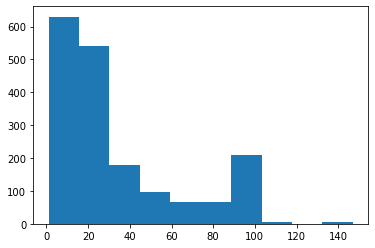

In [116]:
counts, bins = np.histogram(c)
plt.hist(bins[:-1], bins, weights=counts)

Majority of neighborhoods have less than 30 venues

## 3. Analyze Each Neighborhood

In [121]:
# one hot encoding
ny_onehot = pd.get_dummies(ny_venues[['Venue Category']], prefix="", prefix_sep="")



,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle

In [135]:
ny_onehot['Neighborhood'] = ny_venues['Neighborhood'] 

In [136]:
ny_onehot.head()

,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle

In [138]:
## add neighborhood column back to dataframe
ny_onehot['Neighborhood'] = ny_venues['Neighborhood'] 
ny_onehot.head()

#as it didnt go to the last spot i remove it and add it back at first location
col_name='Neighborhood'
first_col = ny_onehot.pop(col_name)
ny_onehot.insert(0, col_name, first_col)
ny_onehot.head()

,Neighborhood,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle

And let's examine the new dataframe size.

In [139]:
ny_onehot.shape

(10158, 439)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [140]:
ny_grouped = ny_onehot.groupby('Neighborhood').mean().reset_index()
ny_grouped

,Neighborhood,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle

#### Let's confirm the new size

In [141]:
ny_grouped.shape

(300, 439)

#### Let's put that 10 top venues into a _pandas_ dataframe

First, let's write a function to sort the venues in descending order.

In [131]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [142]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
nyneighborhoods_venues_sorted = pd.DataFrame(columns=columns)
nyneighborhoods_venues_sorted['Neighborhood'] = ny_grouped['Neighborhood']

for ind in np.arange(ny_grouped.shape[0]):
    nyneighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(ny_grouped.iloc[ind, :], num_top_venues)

nyneighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Deli / Bodega,Pizza Place,Discount Store,Supermarket,Spa,Donut Shop,Check Cashing Service,Fast Food Restaurant,Grocery Store,Fried Chicken Joint
1,Annadale,Pizza Place,Diner,Restaurant,Pub,Food,American Restaurant,Pharmacy,Train Station,Field,Fast Food Restaurant
2,Arden Heights,Pizza Place,Deli / Bodega,Pharmacy,Coffee Shop,Home Service,Yoga Studio,Exhibit,Factory,Falafel Restaurant,Farm
3,Arlington,Boat or Ferry,American Restaurant,Intersection,Bus Stop,Deli / Bodega,Farm,Farmers Market,Fast Food Restaurant,Falafel Restaurant,Food & Drink Shop
4,Arrochar,Bus Stop,Pizza Place,Italian Restaurant,Deli / Bodega,Pharmacy,Cosmetics Shop,Sandwich Place,Hotel,Bagel Shop,Outdoors & Recreation


## 4. Cluster Neighborhoods

Run _k_-means to cluster the neighborhood into 10 clusters.

In [143]:
# set number of clusters
kclusters = 10

ny_grouped_clustering = ny_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(ny_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([7, 7, 7, 0, 0, 1, 1, 1, 1, 5])

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [152]:
# add clustering labels
nyneighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


ValueError: cannot insert Cluster Labels, already exists

In [167]:
nyneighborhoods_venues_sorted

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,7,Allerton,Deli / Bodega,Pizza Place,Discount Store,Supermarket,Spa,Donut Shop,Check Cashing Service,Fast Food Restaurant,Grocery Store,Fried Chicken Joint
1,7,Annadale,Pizza Place,Diner,Restaurant,Pub,Food,American Restaurant,Pharmacy,Train Station,Field,Fast Food Restaurant
2,7,Arden Heights,Pizza Place,Deli / Bodega,Pharmacy,Coffee Shop,Home Service,Yoga Studio,Exhibit,Factory,Falafel Restaurant,Farm
3,0,Arlington,Boat or Ferry,American Restaurant,Intersection,Bus Stop,Deli / Bodega,Farm,Farmers Market,Fast Food Restaurant,Falafel Restaurant,Food & Drink Shop
4,0,Arrochar,Bus Stop,Pizza Place,Italian Restaurant,Deli / Bodega,Pharmacy,Cosmetics Shop,Sandwich Place,Hotel,Bagel Shop,Outdoors & Recreation
5,1,Arverne,Surf Spot,Metro Station,Sandwich Place,Burrito Place,Pizza Place,Tiki Bar,Coffee Shop,BBQ Joint,Board Shop,Donut Shop
6,1,Astoria,Greek Restaurant,Bar,Middle Eastern Restaurant,Bakery,Café,Hookah Bar,Seafood Restaurant,Pizza Place,Indian Restaurant,Gourmet Shop
7,1,Astoria Heights,Bakery,Museum,Italian Restaurant,Burger Joint,Bus Station,Chinese Restaurant,Hostel,Supermarket,Bowling Alley,Motel
8,1,Auburndale,Italian Restaurant,Hookah Bar,Pharmacy,Train,Pet Store,Comic Shop,Athletics & Sports,Mobile Phone Shop,Toy / Game Store,Miscellaneous Shop
9,5,Bath Beach,Bubble Tea Shop,Cantonese Restaurant,Pharmacy,Italian Restaurant,Fast Food Restaurant,Pizza Place,Donut Shop,Chinese Restaurant,Gas Station,Pakistani Restaurant


In [170]:
ny_merged = neighborhoods

# merge ny data to add latitude/longitude for each neighborhood
ny_merged = ny_merged.join(nyneighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

ny_merged.head() # check the last columns!

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,5.0,Pharmacy,Caribbean Restaurant,Donut Shop,Deli / Bodega,Sandwich Place,Dessert Shop,Ice Cream Shop,Food,Laundromat,Yoga Studio
1,Bronx,Co-op City,40.874294,-73.829939,5.0,Fast Food Restaurant,Bus Station,Grocery Store,Pizza Place,Park,Post Office,Fried Chicken Joint,Discount Store,Donut Shop,Salon / Barbershop
2,Bronx,Eastchester,40.887556,-73.827806,5.0,Bus Station,Caribbean Restaurant,Deli / Bodega,Diner,Cosmetics Shop,Seafood Restaurant,Fast Food Restaurant,Chinese Restaurant,Automotive Shop,Bowling Alley
3,Bronx,Fieldston,40.895437,-73.905643,1.0,Plaza,Music Venue,River,Flower Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
4,Bronx,Riverdale,40.890834,-73.912585,5.0,Bus Station,Park,Medical Supply Store,Plaza,Bank,Locksmith,Gym,Playground,Baseball Field,Food Court


For some reason clusters turned to floats, so i have removed NAs and converted them to integers

In [174]:
ny_merged['Cluster Labels'] = ny_merged['Cluster Labels'].fillna(0)
ny_merged['Cluster Labels'] = ny_merged['Cluster Labels'].astype('int64')

Finally, let's visualize the resulting clusters

## 5. Examine Clusters

In [ ]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(ny_merged['Latitude'], ny_merged['Longitude'], ny_merged['Neighborhood'], ny_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

We can see that unlike in Toronto the distribution between clusers is fairer

In [176]:
ny_merged['Cluster Labels'].value_counts()

1    126
5     95
7     51
0     17
8      4
6      4
4      3
3      3
9      2
2      1
Name: Cluster Labels, dtype: int64

#### Cluster 1

In [178]:
ny_merged.loc[ny_merged['Cluster Labels'] == 1, ny_merged.columns[[1] + list(range(5, ny_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,Fieldston,Plaza,Music Venue,River,Flower Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
9,Williamsbridge,Nightclub,Bar,Soup Place,Spa,Metro Station,Dance Studio,Intersection,Event Service,Exhibit,Factory
11,Pelham Parkway,Italian Restaurant,Bus Station,Chinese Restaurant,Pizza Place,Frozen Yogurt Shop,Sushi Restaurant,Coffee Shop,Sandwich Place,Bank,Bakery
12,City Island,Thrift / Vintage Store,Grocery Store,Seafood Restaurant,History Museum,Café,Music Venue,Deli / Bodega,Smoke Shop,Boat or Ferry,Tapas Restaurant
22,Port Morris,Bar,Distillery,Furniture / Home Store,Peruvian Restaurant,Donut Shop,Latin American Restaurant,Restaurant,Spanish Restaurant,Metro Station,Storage Facility
24,Hunts Point,Bank,Waste Facility,Gourmet Shop,Pizza Place,Food,Farmers Market,Café,BBQ Joint,Spanish Restaurant,Juice Bar
34,Belmont,Italian Restaurant,Pizza Place,Deli / Bodega,Bakery,Bank,Liquor Store,Grocery Store,Dessert Shop,Café,Donut Shop
39,Edgewater Park,Italian Restaurant,Deli / Bodega,Pizza Place,Donut Shop,Coffee Shop,Beach,Park,Bar,Asian Restaurant,Chinese Restaurant
46,Bay Ridge,Spa,Pizza Place,Italian Restaurant,Greek Restaurant,Bagel Shop,American Restaurant,Bar,Sushi Restaurant,Pharmacy,Chinese Restaurant
47,Bensonhurst,Donut Shop,Ice Cream Shop,Sushi Restaurant,Pizza Place,Italian Restaurant,Bagel Shop,Bakery,Coffee Shop,Shabu-Shabu Restaurant,Park


#### Cluster 2

Lets compare it to cluser 8

In [179]:
ny_merged.loc[ny_merged['Cluster Labels'] == 8, ny_merged.columns[[1] + list(range(5, ny_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
150,Whitestone,Bubble Tea Shop,Candy Store,Dance Studio,Deli / Bodega,Gaming Cafe,Flower Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
255,Emerson Hill,Food,Construction & Landscaping,Flower Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field
293,Richmond Valley,Bank,Train Station,Smoothie Shop,Food,Sandwich Place,Construction & Landscaping,Convenience Store,Fast Food Restaurant,Mexican Restaurant,Bubble Tea Shop
303,Bayswater,Playground,Construction & Landscaping,Tennis Court,Yoga Studio,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant


Cluster 8 again is likely to be more a laid back environment with some playgrounds, bubble tea shops and farms

## K Means Analysis for combined data set

To combine the data in an easier way, we will bind the rows of both NY and TOR venue files, then generate a wide file for analysis

In [192]:
print(ny_venues.shape)
print(toronto_venues.shape)

(10158, 8)
(2149, 7)


We note that NY has 5 times more rows, but we are looking for similarities and differences and this still should work

In [194]:
ny_venues['City']='NY'
toronto_venues['City']='TOR'

In [195]:
venues = toronto_venues.append(ny_venues)
venues.shape

(12307, 8)

In [196]:
venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,City
0,Parkwoods,43.753259,-79.329656,Brookbanks Park,43.751976,-79.332140,Park,TOR
1,Parkwoods,43.753259,-79.329656,KFC,43.754387,-79.333021,Fast Food Restaurant,TOR
2,Parkwoods,43.753259,-79.329656,Variety Store,43.751974,-79.333114,Food & Drink Shop,TOR
3,Victoria Village,43.725882,-79.315572,Victoria Village Arena,43.723481,-79.315635,Hockey Arena,TOR
4,Victoria Village,43.725882,-79.315572,Tim Hortons,43.725517,-79.313103,Coffee Shop,TOR


In [197]:
onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

In [201]:
# add neighborhood and city column back to dataframe
onehot['Neighborhood'] = venues['Neighborhood']
onehot['City'] = venues['City']
onehot.head()



,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,M

In [202]:
#as it didnt go to the last spot i remove it and add it back at first location
col_name='Neighborhood'
first_col = onehot.pop(col_name)
onehot.insert(0, col_name, first_col)
onehot.head()

,Neighborhood,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restauran

In [203]:
#Put city in front too
col_name='City'
second_col = onehot.pop(col_name)
onehot.insert(1, col_name, second_col)
onehot.head()

,Neighborhood,City,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Luggage Store,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Rest

In [212]:
#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

grouped = onehot.groupby('Neighborhood').mean().reset_index()
grouped

#### Let's confirm the new size

grouped.shape


(400, 468)

#### Let's put that 10 top venues into a _pandas_ dataframe

Let's create the new dataframe and display the top 10 venues for each neighborhood.

In [211]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
venues_sorted = pd.DataFrame(columns=columns)
venues_sorted['Neighborhood'] = grouped['Neighborhood']


for ind in np.arange(grouped.shape[0]):
    venues_sorted.iloc[ind, 1:] = return_most_common_venues(grouped.iloc[ind, :], num_top_venues)

venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Breakfast Spot,Clothing Store,Lounge,Latin American Restaurant,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
1,"Alderwood, Long Branch",Pizza Place,Pub,Skating Rink,Playground,Pharmacy,Coffee Shop,Sandwich Place,Gym,Entertainment Service,Exhibit
2,Allerton,Deli / Bodega,Pizza Place,Discount Store,Spa,Supermarket,Breakfast Spot,Grocery Store,Martial Arts School,Chinese Restaurant,Electronics Store
3,Annadale,Pizza Place,American Restaurant,Pharmacy,Train Station,Diner,Restaurant,Pub,Food,Flower Shop,Factory
4,Arden Heights,Deli / Bodega,Pharmacy,Pizza Place,Coffee Shop,Home Service,Ethiopian Restaurant,Event Service,Escape Room,Farmers Market,Event Space


## 4. Cluster Neighborhoods

Run _k_-means to cluster the neighborhood into 10 clusters.

In [213]:
# set number of clusters
kclusters = 10

grouped_clustering = grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 3, 1, 3, 3, 0, 1, 2, 2, 1])

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [214]:
# add clustering labels
venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


In [234]:
venues_sorted.head()

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2,Agincourt,Breakfast Spot,Clothing Store,Lounge,Latin American Restaurant,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
1,3,"Alderwood, Long Branch",Pizza Place,Pub,Skating Rink,Playground,Pharmacy,Coffee Shop,Sandwich Place,Gym,Entertainment Service,Exhibit
2,1,Allerton,Deli / Bodega,Pizza Place,Discount Store,Spa,Supermarket,Breakfast Spot,Grocery Store,Martial Arts School,Chinese Restaurant,Electronics Store
3,3,Annadale,Pizza Place,American Restaurant,Pharmacy,Train Station,Diner,Restaurant,Pub,Food,Flower Shop,Factory
4,3,Arden Heights,Deli / Bodega,Pharmacy,Pizza Place,Coffee Shop,Home Service,Ethiopian Restaurant,Event Service,Escape Room,Farmers Market,Event Space


In [223]:
venues_sorted.head()
formerge = venues.loc[:, ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'City']] 
formerge.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,City
0,Parkwoods,43.753259,-79.329656,TOR
1,Parkwoods,43.753259,-79.329656,TOR
2,Parkwoods,43.753259,-79.329656,TOR
3,Victoria Village,43.725882,-79.315572,TOR
4,Victoria Village,43.725882,-79.315572,TOR


In [238]:
venues_sorted.head()

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2,Agincourt,Breakfast Spot,Clothing Store,Lounge,Latin American Restaurant,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
1,3,"Alderwood, Long Branch",Pizza Place,Pub,Skating Rink,Playground,Pharmacy,Coffee Shop,Sandwich Place,Gym,Entertainment Service,Exhibit
2,1,Allerton,Deli / Bodega,Pizza Place,Discount Store,Spa,Supermarket,Breakfast Spot,Grocery Store,Martial Arts School,Chinese Restaurant,Electronics Store
3,3,Annadale,Pizza Place,American Restaurant,Pharmacy,Train Station,Diner,Restaurant,Pub,Food,Flower Shop,Factory
4,3,Arden Heights,Deli / Bodega,Pharmacy,Pizza Place,Coffee Shop,Home Service,Ethiopian Restaurant,Event Service,Escape Room,Farmers Market,Event Space


In [236]:

# merge ny data to add latitude/longitude for each neighborhood
merged = venues_sorted.join(formerge.set_index('Neighborhood'), on='Neighborhood')

merged.head() # check the last columns!

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Neighborhood Latitude,Neighborhood Longitude,City
0,2,Agincourt,Breakfast Spot,Clothing Store,Lounge,Latin American Restaurant,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,43.794200,-79.262029,TOR
0,2,Agincourt,Breakfast Spot,Clothing Store,Lounge,Latin American Restaurant,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,43.794200,-79.262029,TOR
0,2,Agincourt,Breakfast Spot,Clothing Store,Lounge,Latin American Restaurant,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,43.794200,-79.262029,TOR
0,2,Agincourt,Breakfast Spot,Clothing Store,Lounge,Latin American Restaurant,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,43.794200,-79.262029,TOR
1,3,"Alderwood, Long Branch",Pizza Place,Pub,Skating Rink,Playground,Pharmacy,Coffee Shop,Sandwich Place,Gym,Entertainment Service,Exhibit,43.602414,-79.543484,TOR


Change column names

In [227]:
merged.rename(columns={'Neighborhood Latitude': 'Latitude', 'Neighborhood Longitude': 'Longitude'}, inplace = True)

Finally, let's visualize the resulting clusters

## 5. Examine Clusters

In [ ]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(merged['Latitude'], merged['Longitude'], merged['Neighborhood'], merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

Looking at both clusters of clusters we can see that Blue -1 predominates, with purple being more in NY and green in TOR. Red is not found anywhere in TOR at all. We would like to investigate these four clusters.

In [229]:
merged['Cluster Labels'].value_counts()

2    8330
1    3364
0     279
3     246
6      72
8       8
9       3
5       2
4       2
7       1
Name: Cluster Labels, dtype: int64

#### Cluster 2 (most dominant)

In [241]:
venues_sorted.loc[venues_sorted['Cluster Labels'] == 2]

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2,Agincourt,Breakfast Spot,Clothing Store,Lounge,Latin American Restaurant,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
7,2,Arverne,Surf Spot,Metro Station,Sandwich Place,Café,Pizza Place,Coffee Shop,Board Shop,BBQ Joint,Bus Stop,Tiki Bar
8,2,Astoria,Greek Restaurant,Bar,Middle Eastern Restaurant,Bakery,Hookah Bar,Café,Seafood Restaurant,Pizza Place,Indian Restaurant,Japanese Restaurant
10,2,Auburndale,Italian Restaurant,Comic Shop,Discount Store,Train,Train Station,Pet Store,Athletics & Sports,Pharmacy,Toy / Game Store,Miscellaneous Shop
13,2,Battery Park City,Park,Coffee Shop,Clothing Store,Hotel,Women's Store,Boat or Ferry,Gym,Playground,Memorial Site,Burger Joint
14,2,Bay Ridge,Italian Restaurant,Spa,Pizza Place,Greek Restaurant,Bar,Bagel Shop,American Restaurant,Grocery Store,Pharmacy,Chinese Restaurant
15,2,Bay Terrace,Clothing Store,Donut Shop,American Restaurant,Supermarket,Shoe Store,Cosmetics Shop,Mobile Phone Shop,Kids Store,Women's Store,Men's Store
17,2,Bayside,Bar,Mexican Restaurant,Pizza Place,Sushi Restaurant,Indian Restaurant,Spa,American Restaurant,Pub,Chinese Restaurant,Italian Restaurant
18,2,Bayswater,Construction & Landscaping,Tennis Court,Playground,Yoga Studio,Fast Food Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
21,2,"Bedford Park, Lawrence Manor East",Sandwich Place,Coffee Shop,Italian Restaurant,Pizza Place,Pub,Café,Thai Restaurant,Liquor Store,Toy / Game Store,Restaurant


Hotels, Gym, restuarants, Coffee Shops and so on

In [242]:
venues_sorted.loc[venues_sorted['Cluster Labels'] == 1]

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,1,Allerton,Deli / Bodega,Pizza Place,Discount Store,Spa,Supermarket,Breakfast Spot,Grocery Store,Martial Arts School,Chinese Restaurant,Electronics Store
6,1,Arrochar,Bus Stop,Pizza Place,Italian Restaurant,Deli / Bodega,Food Truck,Athletics & Sports,Middle Eastern Restaurant,Sandwich Place,Liquor Store,Supermarket
9,1,Astoria Heights,Museum,Playground,Bakery,Motel,Hostel,Bus Station,Pizza Place,Supermarket,Chinese Restaurant,Plaza
11,1,Bath Beach,Pizza Place,Italian Restaurant,Donut Shop,Cantonese Restaurant,Gas Station,Fast Food Restaurant,Bubble Tea Shop,Pharmacy,Chinese Restaurant,Dim Sum Restaurant
12,1,"Bathurst Manor, Wilson Heights, Downsview North",Bank,Coffee Shop,Diner,Chinese Restaurant,Shopping Mall,Park,Sandwich Place,Middle Eastern Restaurant,Mobile Phone Shop,Gas Station
16,1,Baychester,Bank,Donut Shop,Fried Chicken Joint,Rental Car Location,Gym / Fitness Center,Electronics Store,Men's Store,Sandwich Place,Mexican Restaurant,Pet Store
20,1,Bedford Park,Diner,Pizza Place,Mexican Restaurant,Deli / Bodega,Sandwich Place,Chinese Restaurant,Pub,Baseball Field,Donut Shop,Grocery Store
23,1,Beechhurst,Yoga Studio,Boutique,Park,Chinese Restaurant,Donut Shop,Salad Place,Optical Shop,Restaurant,Spa,Pizza Place
24,1,Bellaire,Chinese Restaurant,Breakfast Spot,Coffee Shop,Italian Restaurant,Intersection,Gym,Deli / Bodega,Convenience Store,Supermarket,Greek Restaurant
26,1,Bellerose,Deli / Bodega,Pizza Place,Pub,Seafood Restaurant,Bank,Liquor Store,Salon / Barbershop,Donut Shop,Mobile Phone Shop,Diner


Museum, Restaurants, Spas, Supermarkets, Grocery stores, Pizza place

In [243]:
venues_sorted.loc[venues_sorted['Cluster Labels'] == 0]

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,0,Arlington,Intersection,Boat or Ferry,Bus Stop,American Restaurant,Deli / Bodega,Event Space,Exhibit,Event Service,Filipino Restaurant,Factory
25,0,Belle Harbor,Beach,Pub,Italian Restaurant,Spa,Deli / Bodega,Bakery,Boutique,Chinese Restaurant,Bagel Shop,Mexican Restaurant
37,0,Briarwood,Deli / Bodega,Playground,Arts & Crafts Store,Gym,Indian Restaurant,Convenience Store,Bus Station,Coffee Shop,Plaza,Farm
44,0,Brookville,Deli / Bodega,Yoga Studio,Filipino Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory
52,0,Canarsie,Caribbean Restaurant,Thai Restaurant,Deli / Bodega,Food,Asian Restaurant,Gym,Yoga Studio,Farmers Market,Escape Room,Ethiopian Restaurant
162,0,Grymes Hill,Deli / Bodega,Dog Run,Yoga Studio,Field,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit
211,0,Longwood,Deli / Bodega,Fast Food Restaurant,Grocery Store,Diner,Mexican Restaurant,Playground,Sandwich Place,Donut Shop,Women's Store,Latin American Restaurant
213,0,Madison,Bagel Shop,Deli / Bodega,Spa,Italian Restaurant,Pilates Studio,Restaurant,Pizza Place,Candy Store,Dessert Shop,Yoga Studio
223,0,Mariner's Harbor,Deli / Bodega,Bus Stop,Other Repair Shop,Italian Restaurant,Supermarket,Factory,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant
245,0,New Brighton,Bus Stop,Deli / Bodega,Park,Bowling Alley,Discount Store,Construction & Landscaping,Playground,Yoga Studio,Falafel Restaurant,Farmers Market


Looks like beach areas, and everything that come swith it, entertainemnt eateries

In [244]:
venues_sorted.loc[venues_sorted['Cluster Labels'] == 6]

,Cluster Labels,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
30,6,Bergen Beach,Harbor / Marina,Park,Baseball Field,Trail,Athletics & Sports,Playground,Yoga Studio,Farm,Entertainment Service,Escape Room
50,6,Caledonia-Fairbanks,Park,Women's Store,Pool,Yoga Studio,Fast Food Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
71,6,Clason Point,Park,South American Restaurant,Pool,Convenience Store,Grocery Store,Scenic Lookout,Bus Stop,Playground,Boat or Ferry,Yoga Studio
98,6,Downsview East,Park,Airport,Snack Place,Yoga Studio,Farmers Market,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
137,6,Forest Hill North & West,Park,Trail,Jewelry Store,Sushi Restaurant,Yoga Studio,Farmers Market,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant
149,6,Glencairn,Bakery,Japanese Restaurant,Park,Asian Restaurant,Fast Food Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
200,6,Lawrence Park,Park,Swim School,Bus Line,Dim Sum Restaurant,Yoga Studio,Fast Food Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service
233,6,"Milliken, Agincourt North, Steeles East, L'Amo...",Intersection,Park,Playground,Fast Food Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space
253,6,"North Park, Maple Leaf Park, Upwood Park",Bakery,Park,Basketball Court,Construction & Landscaping,Field,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit
274,6,Parkwoods,Fast Food Restaurant,Park,Food & Drink Shop,Yoga Studio,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space


Parks, pools, Trails, some farms

## Results & Discussion <a name="Results & Discussion"></a>

In this study we investigated neighborhoods of Toronto and New York. We used k means clustering method to make sense of the data. The majority of the neighborhoods seem to fall into busy district type of neighborhoods. There is also clearly more parks in Toronto than in NY. Also it seems that there are beaches in NY and not in Toronto. That could be because its colder in Toronto compared to New York. 

## Conclusion <a name="Conclusion"></a>

These studies show that there is a big similarity in neighborhoods between Toronto and New York. However, there are slight differences too, that are more unique to each city